In [1]:
import copy
import glob
import time
import os
import shutil
import sys

import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from tqdm.auto import tqdm

In [2]:
import celloracle as co
from celloracle.applications import Pseudotime_calculator
from celloracle.applications import Gradient_calculator
from celloracle.applications import Oracle_development_module

co.__version__

/opt/conda/envs/celloracle2/lib/python3.8/site-packages/logomaker/src/validate.py:98: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if matrix_type is 'information':
/opt/conda/envs/celloracle2/lib/python3.8/site-packages/logomaker/src/validate.py:104: SyntaxWarning: "is" with a literal. Did you mean "=="?
  elif matrix_type is 'probability':


'0.18.0'

In [3]:
#Set working directory
os.chdir("/storage1/fs1/jmillman/Active/DigitalTwin")

save_folder = "outputs/celloracle_figures/DT_Subset_EC_Beta"


In [4]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [6,6]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600

%matplotlib inline


# TF Perturbations Prep

In [5]:
# Load oracle object. 
oracle = co.load_hdf5("checkpoints/celloracle/DT_Subset_EC_Beta.celloracle.oracle")
oracle


Oracle object

Meta data
    celloracle version used for instantiation: 0.18.0
    n_cells: 6922
    n_genes: 3112
    cluster_name: celltype_Beta_EC_subset
    dimensional_reduction_name: X_umap
    n_target_genes_in_TFdict: 21832 genes
    n_regulatory_in_TFdict: 1094 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 216 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 2809 genes
    k_for_knn_imputation: 173
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Not finished

In [6]:
# 1) Get TFdict regardless of where it lives (top-level vs GRN_unit)
TFdict = getattr(oracle, "TFdict", None)
if TFdict is None and hasattr(oracle, "GRN_unit"):
    TFdict = getattr(oracle.GRN_unit, "TFdict", None)
if TFdict is None:
    raise AttributeError("Could not find TFdict on oracle or oracle.GRN_unit")

# 2) Get expressed genes (the gene index of your scRNA-seq matrix)
#    Prefer raw.var_names if present; otherwise fall back to var_names
adata = oracle.adata
if hasattr(adata, "raw") and adata.raw is not None:
    expr_genes = set(map(str, adata.raw.var_names))
else:
    expr_genes = set(map(str, adata.var_names))

# 3) TFs present in both TFdict and scRNA-seq
tfs_in_TFdict = set(map(str, TFdict.keys()))
tfs_in_both = sorted(tfs_in_TFdict & expr_genes)

# 4) Unique target genes defined in TFdict
def collect_all_targets(tf_dict):
    targets = set()
    for tg in tf_dict.values():
        # Accept common container types
        if isinstance(tg, (list, set, tuple)):
            targets.update(map(str, tg))
        elif isinstance(tg, np.ndarray):
            targets.update(map(str, tg.tolist()))
        elif isinstance(tg, pd.Series):
            targets.update(map(str, tg.values))
        else:
            # Some builds store targets in a DataFrame (e.g., one column of target names)
            if isinstance(tg, pd.DataFrame):
                # Heuristic: grab first column
                targets.update(map(str, tg.iloc[:, 0].dropna().astype(str).tolist()))
            else:
                # Last resort: try iterable
                try:
                    targets.update(map(str, list(tg)))
                except Exception:
                    pass
    return targets

all_targets_in_TFdict = collect_all_targets(TFdict)

# 5) Target genes present in both TFdict and scRNA-seq
available_TFs = sorted(all_targets_in_TFdict & expr_genes)

# 6) Print counts (should match oracle meta if everything lines up)
print(f"n_target_genes_both_TFdict_and_scRNA-seq: {len(available_TFs)}")

# 7) Access the lists you asked for:

n_target_genes_both_TFdict_and_scRNA-seq: 216


In [7]:
# 7) Access the lists you asked for:
len(available_TFs)

216

In [ ]:
palette= ['#ba0c2f', "#015f94", "#fcb686", "#cd853f"]

oracle.update_cluster_colors(palette)


Clustering name:  celltype_Beta_EC_subset
Cluster list ['Beta', 'Beta-EC', 'EC', 'eEP', 'lEP']


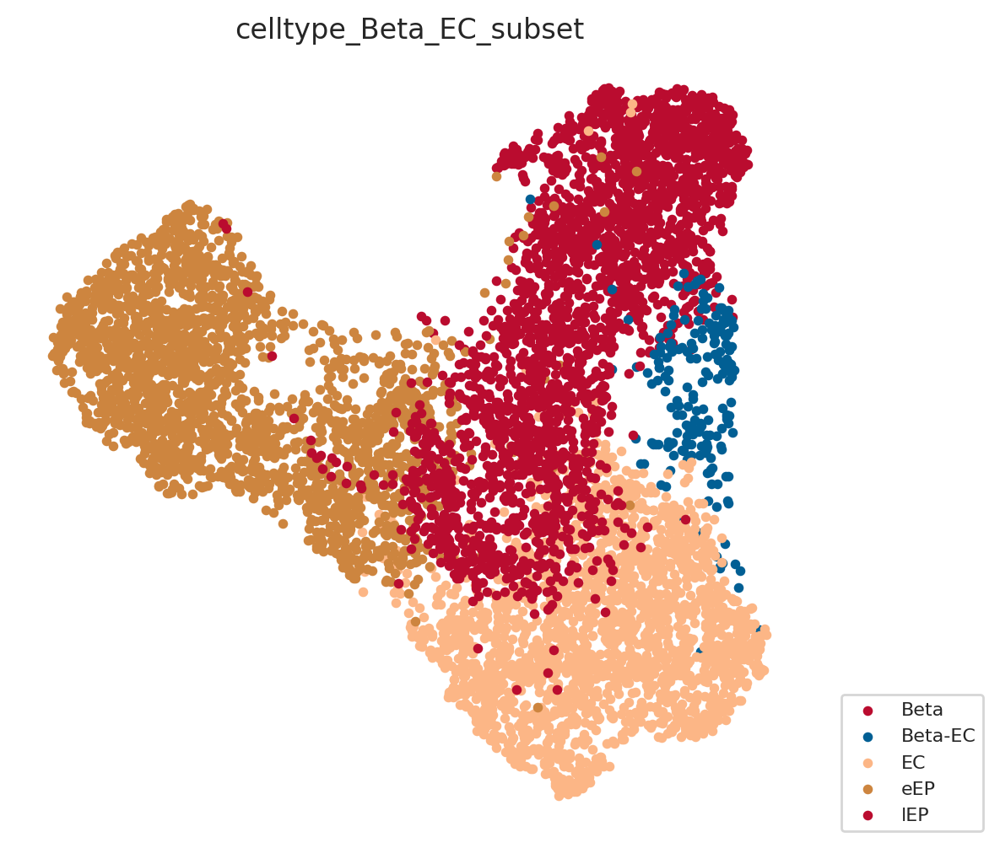

In [9]:
# Instantiate pseudotime object using oracle object.
pt = Pseudotime_calculator(oracle_object=oracle)

print("Clustering name: ", pt.cluster_column_name)
print("Cluster list", pt.cluster_list)

# Check data
pt.plot_cluster(fontsize=8)


In [10]:
# Load inferred GRNs
links = co.load_hdf5("checkpoints/celloracle/DT_Subset_EC_Beta.celloracle.links")

# Save GRN as csv
links.links_dict["Beta"].to_csv("outputs/celloracle_tables/raw_GRN_for_DT_Subset_EC_Beta_Beta.csv")
links.links_dict["EC"].to_csv("outputs/celloracle_tables/raw_GRN_for_DT_Subset_EC_Betat_EC.csv")
links.links_dict["eEP"].to_csv("outputs/celloracle_tables/raw_GRN_for_DT_Subset_EC_Beta_eEP.csv")
links.links_dict["lEP"].to_csv("outputs/celloracle_tables/raw_GRN_for_DT_Subset_EC_Beta_lEP.csv")
links.links_dict["Beta-EC"].to_csv("outputs/celloracle_tables/raw_GRN_for_DT_Subset_EC_Beta_Beta-EC.csv")

# Save GRN as csv
net_scores = links.merged_score
net_scores.to_csv("outputs/celloracle_tables/Network_Scores_per_Cluster_DT_Subset_EC_Beta_paper.csv")

In [11]:
# Make predictive models for simulation
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10, 
                              use_cluster_specific_TFdict=True)

  0%|          | 0/5 [00:00<?, ?it/s]

# Sankey Plot of The Top candidate

In [ ]:
#Enter perturbation conditions to simulate signal propagation after the perturbation.

goi_list = ['PAX4'] #Top candidate

pt.plot_cluster(fontsize=8)

from IPython.display import clear_output

for goi in goi_list: 
    
    clear_output(wait=True)

    #Check the specific TF
        
    plt.style.use('dark_background')
    oracle.simulate_shift(perturb_condition={goi: 0.0},
                        n_propagation=3)
    plt.style.use('default')
      
    #Simulate Perturbations
      
    # Get transition probability
    oracle.estimate_transition_prob(n_neighbors=200,
                                  knn_random=True, 
                                  sampled_fraction=1)
    
    # Calculate embedding 
    oracle.calculate_embedding_shift(sigma_corr=0.05)
    
    fig, ax = plt.subplots(1, 2,  figsize=[13, 6])
    
    scale = 10
    
    # Show quiver plot
    oracle.plot_quiver(scale=scale, ax=ax[0])
    ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")
        
    # Show quiver plot that was calculated with randomized graph.
    oracle.plot_quiver_random(scale=scale, ax=ax[1])
    ax[1].set_title(f"Randomized simulation vector")
    
    plt.show()
    
    # n_grid = 40 is a good starting value.
    n_grid = 40 
    oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
    
    # Search for best min_mass.
    oracle.suggest_mass_thresholds(n_suggestion=8)
      
    #set the correct grid size according to the previous plots
    min_mass = 14
    oracle.calculate_mass_filter(min_mass=min_mass, plot=True)
      
    fig, ax = plt.subplots(1, 2,  figsize=[13, 6])
    
    scale_simulation = 4
      
    # Show quiver plot
    oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
    ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")
    
    # Show quiver plot that was calculated with randomized graph.
    oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
    ax[1].set_title(f"Randomized simulation vector")
    
    plt.show()
    
    # Plot vector field with cell cluster 
    fig, ax = plt.subplots(figsize=[8, 8])
    
    oracle.plot_cluster_whole(ax=ax, s=10)
    oracle.plot_simulation_flow_on_grid(scale=scale_simulation, 
                                          ax=ax, show_background=False)
      
    # Save the plot as .jpg
    plt.savefig(f"{save_folder}/KO_{goi}.jpg",
                  format="jpg")
      
    # Check data
    pt.plot_cluster(fontsize=8)
   
    #Pseudotime
      
    # Here, clusters can be classified into specific lineages
    
    clusters_end_lineage = ["EC",'Beta-EC',"Beta","eEP","lEP"]
    
    # Make a dictionary
    lineage_dictionary = {"Endocrine": clusters_end_lineage}
    
    # Input lineage information into pseudotime object
    pt.set_lineage(lineage_dictionary=lineage_dictionary)
    
    # Visualize lineage information
    pt.plot_lineages()
    
    # Estimated root cell name for each lineage
    root_cells = {"Endocrine": "s5d3_GAGTCAAAGTTCCTCA-1_paired"}
    pt.set_root_cells(root_cells=root_cells)
    # Check root cell and lineage (it has to be close to an edge)
    pt.plot_root_cells()
    #"s5d5_AAACATGCAAAGCTCC-1" <- other root cell for s5d5
      
    # Calculate pseudotime
    pt.get_pseudotime_per_each_lineage()
    
    # Check results
    pt.plot_pseudotime(cmap="rainbow")
      
    # Add calculated pseudotime data to the oracle object
    oracle.adata.obs = pt.adata.obs
      
    # Visualize pseudotime
    
    fig, ax = plt.subplots(figsize=[6,6])
    sc.pl.embedding(adata=oracle.adata, basis=oracle.embedding_name, 
                      ax=ax, cmap="rainbow",
                      color=["pseudotime_Beta_EC_subset"])
      
    #Make Gradient_calculator object
    
    # Instantiate Gradient calculator object
    gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="pseudotime_Beta_EC_subset")
    gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=194)
    gradient.calculate_mass_filter(min_mass=min_mass, plot=True)
      
    #Transfer pseudotime values to the grid points.
    gradient.transfer_data_into_grid(args={"method": "polynomial", 
                                             "n_poly":3}, plot=True)
    
    # Calculate graddient
    gradient.calculate_gradient()
    
    # Show results
    scale_dev = 40
    gradient.visualize_results(scale=scale_dev, s=5)
     
    # Visualize results
    fig, ax = plt.subplots(figsize=[6, 6])
    gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)
    gradient.to_hdf5("checkpoints/gradient_DT_Subset_EC_Beta.celloracle.gradient")

    # Make Oracle_development_module to compare two vector field
    dev = Oracle_development_module()
    
    # Load development flow
    dev.load_differentiation_reference_data(gradient_object=gradient)
    
    # Load simulation result
    dev.load_perturb_simulation_data(oracle_object=oracle)
    
    
    # Calculate inner produc scores
    dev.calculate_inner_product()
    dev.calculate_digitized_ip(n_bins=10)
      
    # Show perturbation scores
    vm = 0.02
    
    fig, ax = plt.subplots(1, 2, figsize=[12, 6])
    dev.plot_inner_product_on_grid(vm=0.02, s=50, ax=ax[0])
    ax[0].set_title(f"Perturbation Score KO {goi}")
    
    dev.plot_inner_product_random_on_grid(vm=vm, s=50, ax=ax[1])
    ax[1].set_title(f"PS calculated with Randomized simulation vector")
    plt.show()
          
    # Show perturbation scores with perturbation simulation vector field
    fig, ax = plt.subplots(figsize=[6, 6])
    dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax)
    dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)
    ax.set_title(f"Plot {goi} KO")

    # Save the plot as a high-resolution JPG (600 dpi)
    plt.savefig(
    f"{save_folder}/Plot {goi} KO.jpg",
    format="jpg",
    dpi=600,
    bbox_inches="tight"  # optional, trims extra whitespace
    )
      
    # Optional: Show the plot on the screen
    plt.show()
        
    # Let's visualize the results 
    dev.visualize_development_module_layout_0(s=5,
                                scale_for_simulation=scale_simulation,
                                s_grid=50,
                                scale_for_pseudotime=scale_dev,
                                vm=vm)
    
    # Add a title
    plt.suptitle(f"Perturbation of {goi} KO")
      
    # Save the plot as .jpg
    plt.savefig(f"{save_folder}/Perturbation of {goi} KO.jpg", format="jpg")
      
    # Display the plot
    plt.show()


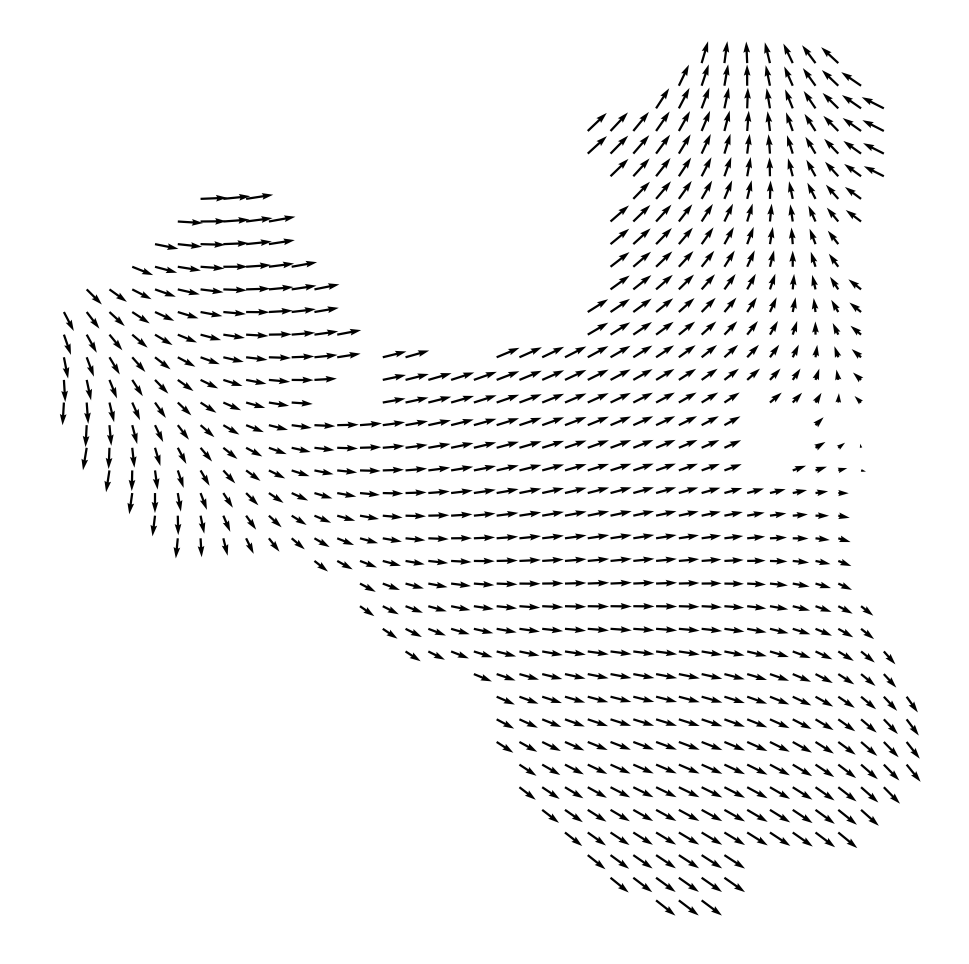

Saved: outputs/celloracle_figures/DT_Subset_EC_Beta/dev_flow_only_transparent.png


In [13]:
output_dir = "outputs/celloracle_figures/DT_Subset_EC_Beta"
os.makedirs(output_dir, exist_ok=True)
out_png = os.path.join(output_dir, "dev_flow_only_transparent.png")

fig, ax = plt.subplots(figsize=(6, 6))

# Draw ONLY the developmental flow (try without background if supported)
try:
    gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax, show_background=False)
except TypeError:
    # Some versions don't have show_background
    gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)

# Remove axes / frame
ax.set_axis_off()

# Make figure + axes fully transparent
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)

# Save as transparent PNG
fig.savefig(
    out_png,
    dpi=600,
    transparent=True,
    bbox_inches="tight",
    pad_inches=0
)

plt.show()
plt.close(fig)

print("Saved:", out_png)
# Fig. 5C

In [13]:
%%time
# n_steps is the number of steps in markov simulation.
# n_duplication is the number of technical duplication for the simulation
oracle.run_markov_chain_simulation(n_steps=200, n_duplication=5)

CPU times: user 1min 53s, sys: 1.1 s, total: 1min 54s
Wall time: 1min 55s


cell zhu.sn.d21_CACGGGTTCCTTCTAA-1_expression


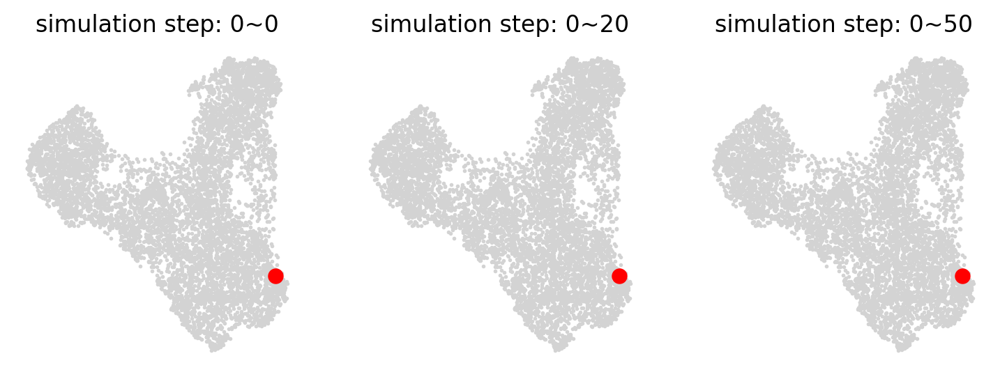

cell zhu.sn.d21_TCGCTCACATGAGTAA-1_expression


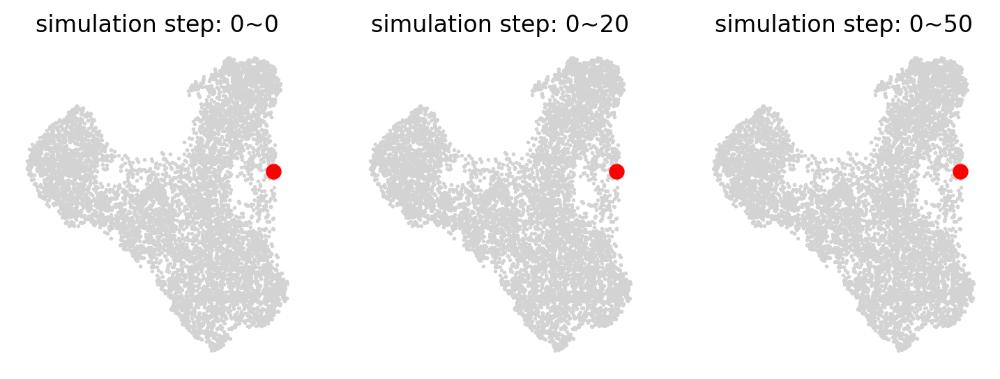

cell s5d3_GTTAACCAGGGCCATC-1_paired


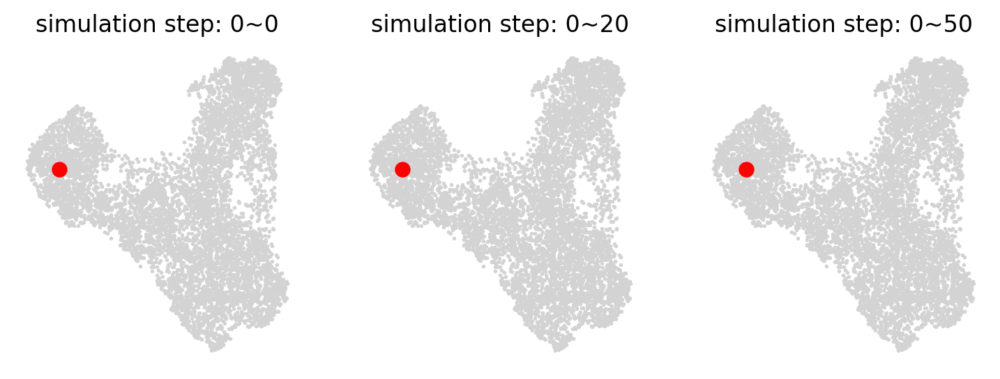

In [14]:
np.random.seed(777)
cells = np.random.choice(oracle.adata.obs.index.values, size=3, replace=False)
    # Visualize the simulated results of cell transition after perturbation
for k in cells:
    print(f"cell {k}")
    plt.figure(figsize=[9, 3])
    for j, i in enumerate([0, 20, 50]): # time points
        plt.subplot(1, 3, (j+1))
        oracle.plot_mc_results_as_trajectory(k, range(0, i))
        plt.title(f"simulation step: 0~{i}")
        plt.axis("off")
    plt.show()

In [15]:
cl = "celltype_Beta_EC_subset"

# Desired order (filter to those actually present)
desired_order = ["Beta",'Beta-EC', "EC", "lEP", "eEP"]
cats = list(oracle.adata.obs[cl].astype("category").cat.categories)
order_present = [c for c in desired_order if c in cats]

# Your palette mapping
palette_map = {
    "Beta":   "#ba0c2f",  # WashU red
    "EC":     "#015f94",  # Royal blue
    "eEP":     "#fcb686",  # Light orange
    "lEP":     "#cd853f",  # Peru color
    'Beta-EC': "#b867bf"
    }
# Build the color list aligned to *current category order* (cats)
color_list = [palette_map.get(c, "#999999") for c in cats]  # fallback gray for others
oracle.adata.uns[f"{cl}_colors"] = color_list

# Plot Sankey with explicit order and your colors
plt.figure(figsize=[5, 6])
oracle.plot_mc_results_as_sankey(
    cluster_use=cl,
    start=0,
    end=100,
    order=order_present,   # <- enforces eBeta → Beta-EC → eEC → lEP → eEP
    font_size=10
)
plt.savefig(
    f"outputs/celloracle_figures/DT_Subset_EC_Beta/{goi}_DT_Subset_EC_Beta_sankey_plot.png",
    dpi=600,
    bbox_inches="tight"
)
plt.close()


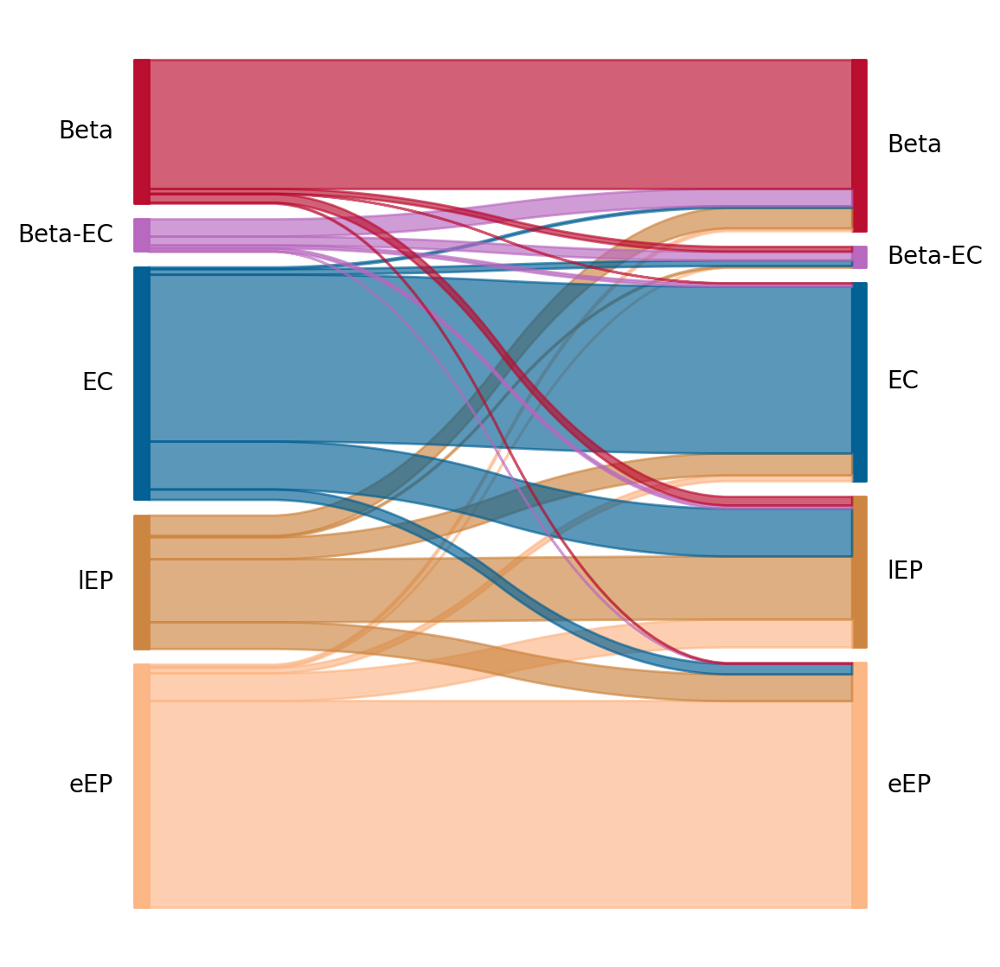

In [16]:
# Interactive plot (pan/zoom etc.)
plt.figure(figsize=(6, 7))
oracle.plot_mc_results_as_sankey(
    cluster_use=cl,
    start=0,
    end=100,
    order=order_present,
    font_size=10
)
plt.show()

# Simulate all the TF KOs Fig. S22E

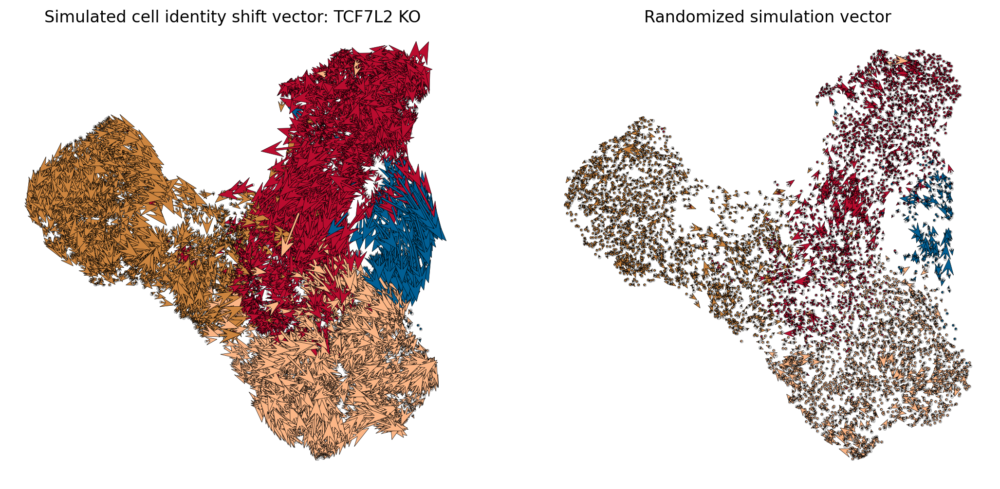

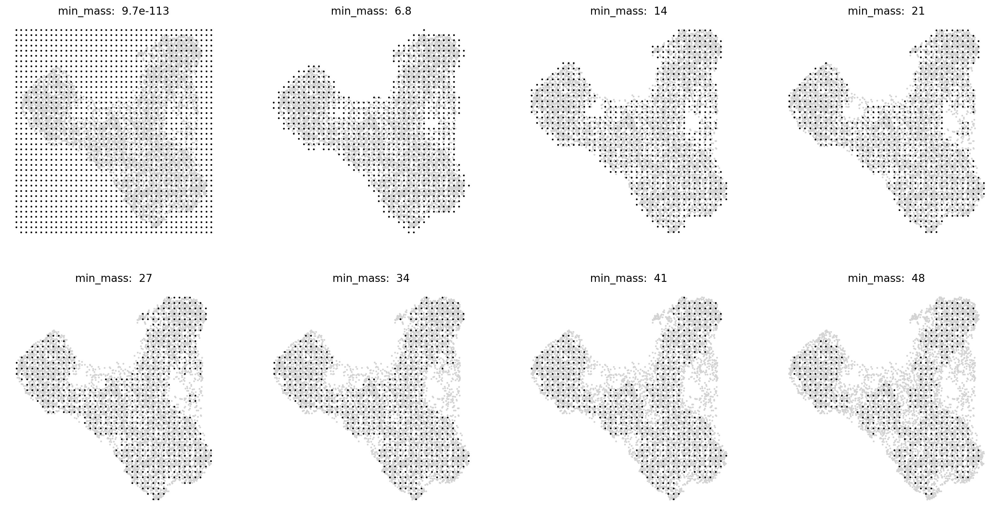

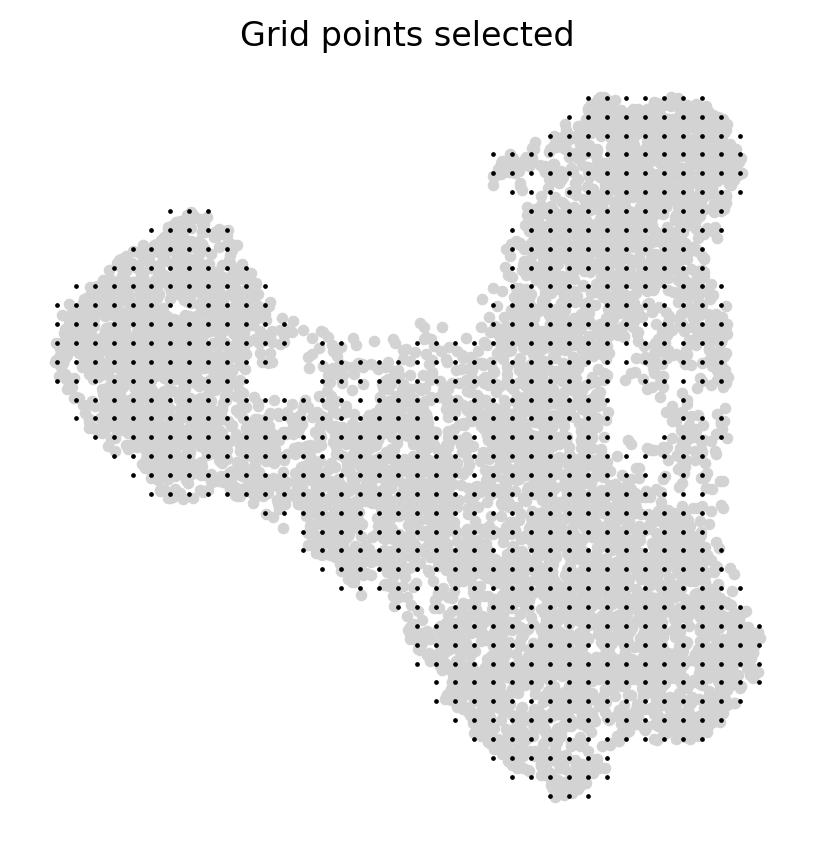

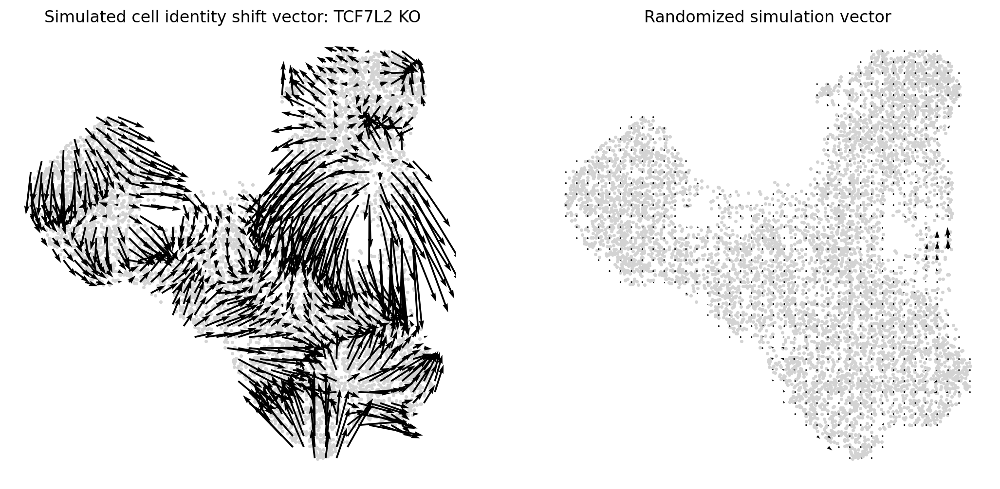

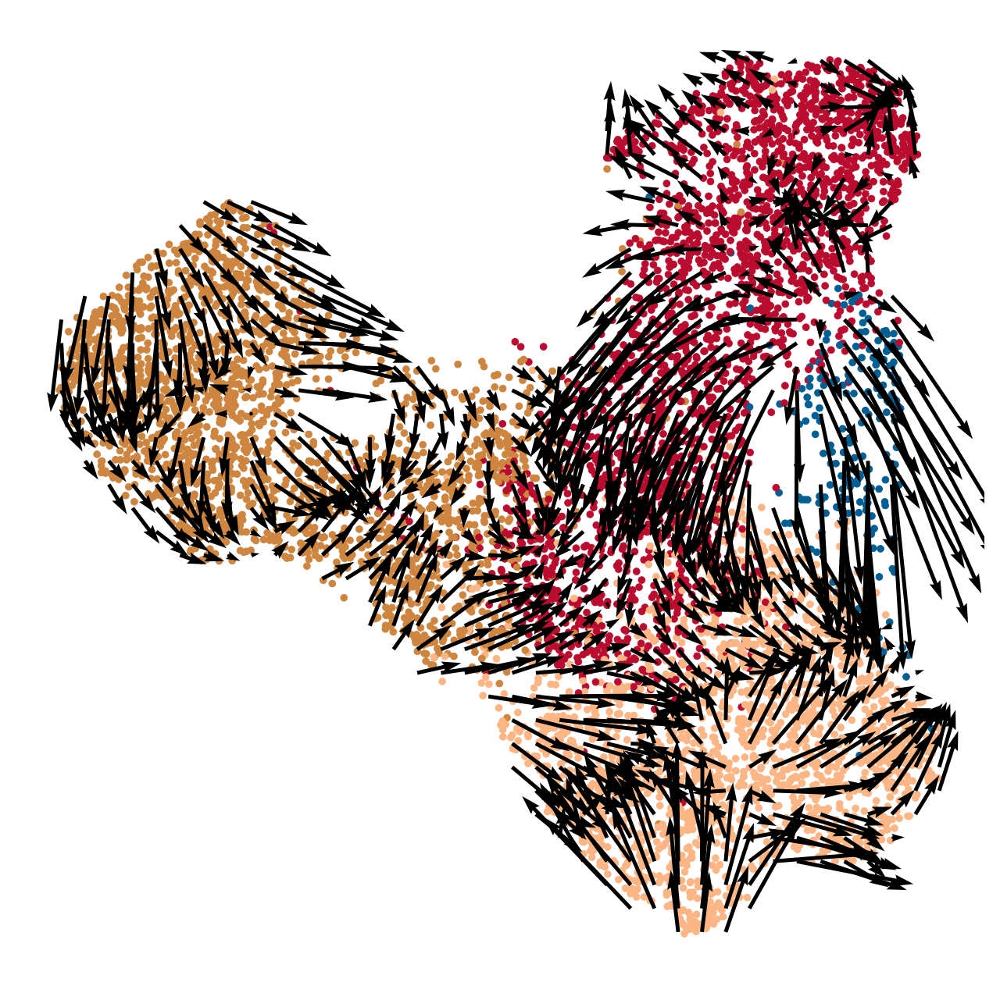

...

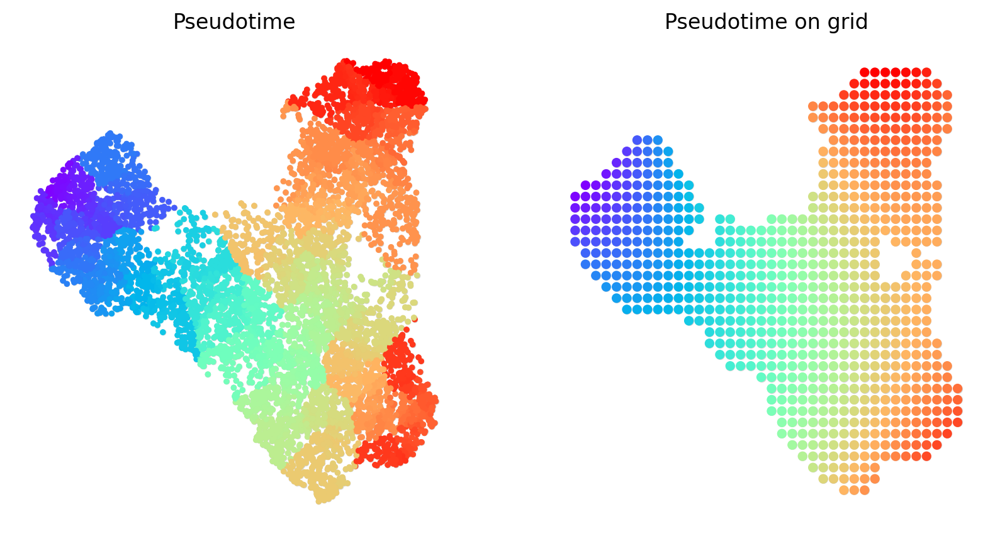

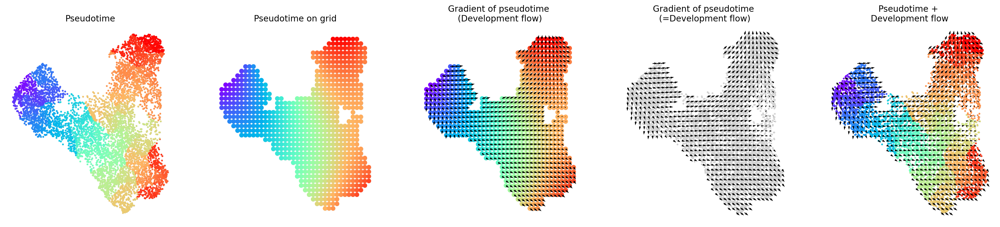

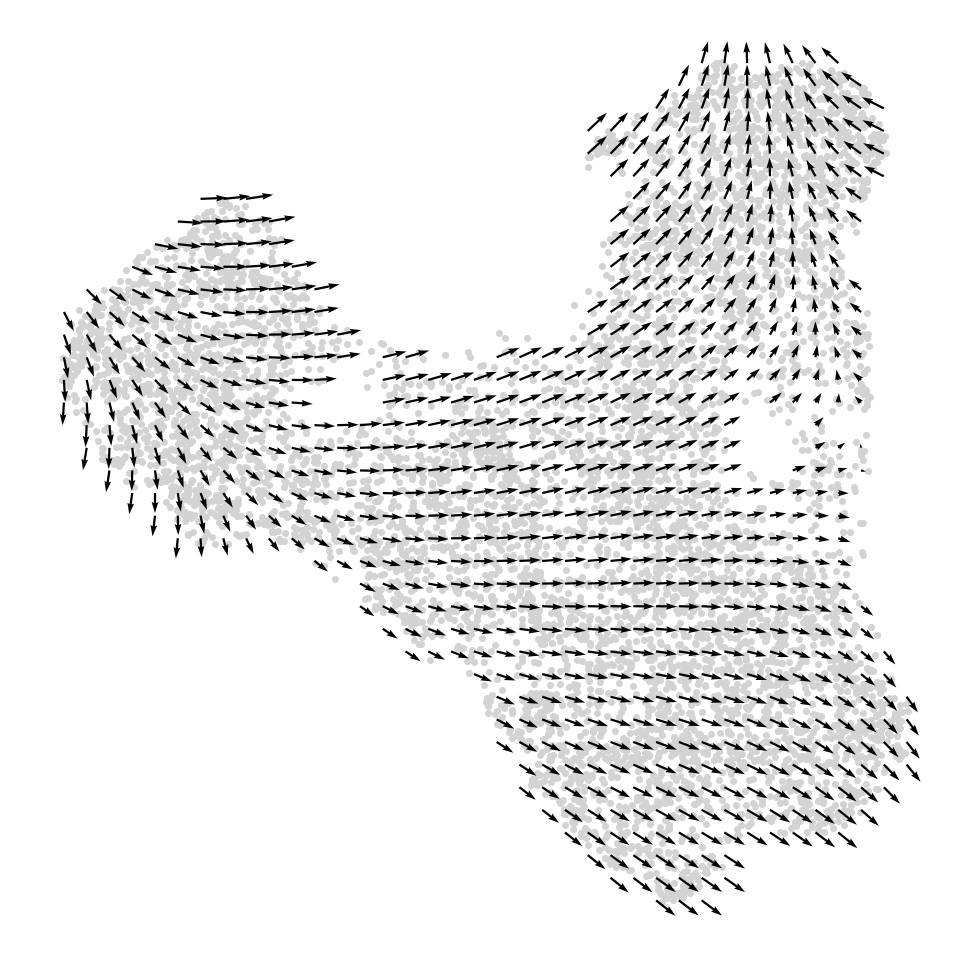

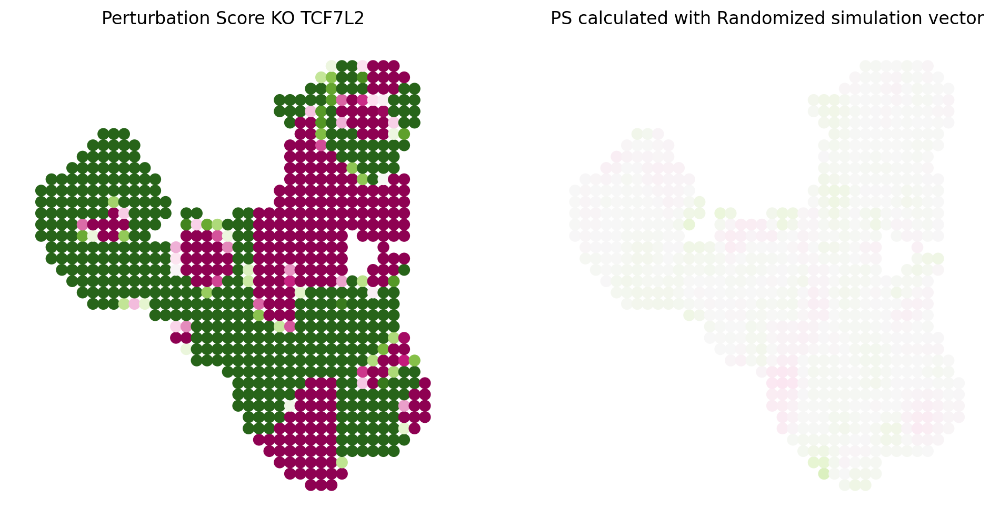

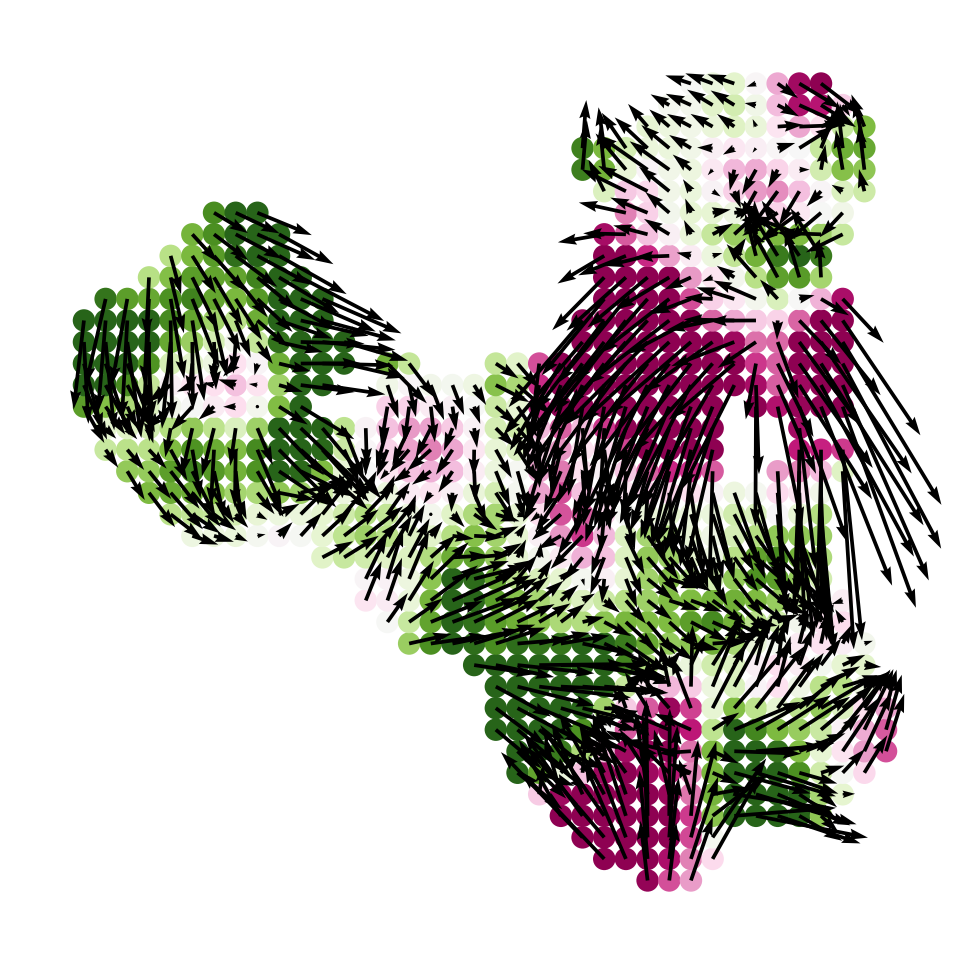

[OK] TCF7L2

Completed: 1 genes
Skipped : 0 genes


In [13]:
#Enter perturbation conditions to simulate signal propagation after the perturbation.

goi_list = ['TCF7L2'] # For testing


'''
available_TFs #All
'''

from IPython.display import clear_output
import matplotlib.pyplot as plt
import pandas as pd

skipped = []   # list of (gene, reason)
done    = []   # list of genes successfully processed

def _should_skip_beforehand(goi, oracle):
    # Optional fast precheck: skip if gene is not an active regulatory gene (when attr exists)
    if hasattr(oracle, "active_regulatory_genes"):
        if goi not in set(map(str, oracle.active_regulatory_genes)):
            return f"Gene {goi} not in oracle.active_regulatory_genes"
    return None

for goi in goi_list:
    clear_output(wait=True)
    pre_reason = _should_skip_beforehand(goi, oracle)
    if pre_reason:
        print(f"[SKIP] {goi}: {pre_reason}")
        skipped.append((goi, pre_reason))
        continue

    try:
        # ---- simulate KO ----
        plt.style.use('dark_background')
        oracle.simulate_shift(
            perturb_condition={goi: 0.0},
            n_propagation=3
        )
    except ValueError as e:
        msg = str(e)
        # Specific CellOracle error to skip
        if "does not have enough regulatory connection" in msg or "Cannot perform simulation" in msg:
            print(f"[SKIP] {goi}: {msg}")
            skipped.append((goi, msg))
            continue
        else:
            # Unexpected ValueError → skip but record
            print(f"[SKIP-ValueError] {goi}: {msg}")
            skipped.append((goi, msg))
            continue
    except Exception as e:
        # Any other unexpected error → skip but keep going
        print(f"[SKIP-OTHER] {goi}: {repr(e)}")
        skipped.append((goi, repr(e)))
        continue
    finally:
        # Always restore default style so later plots aren't stuck in dark bg
        plt.style.use('default')

    # -----------------------
    # If we got here, simulation ran — proceed with your pipeline
    # -----------------------

    # Get transition probability
    oracle.estimate_transition_prob(
        n_neighbors=200,
        knn_random=True, 
        sampled_fraction=1
    )

    # Calculate embedding shift
    oracle.calculate_embedding_shift(sigma_corr=0.05)

    fig, ax = plt.subplots(1, 2, figsize=[13, 6])
    scale = 10
    oracle.plot_quiver(scale=scale, ax=ax[0])
    ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")
    oracle.plot_quiver_random(scale=scale, ax=ax[1])
    ax[1].set_title("Randomized simulation vector")
    plt.show()

    # Grid + mass filter
    n_grid = 40
    oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
    oracle.suggest_mass_thresholds(n_suggestion=8)

    min_mass = 14
    oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

    fig, ax = plt.subplots(1, 2, figsize=[13, 6])
    scale_simulation = 4
    oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
    ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")
    oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
    ax[1].set_title("Randomized simulation vector")
    plt.show()

    # Overlay with clusters
    fig, ax = plt.subplots(figsize=[8, 8])
    oracle.plot_cluster_whole(ax=ax, s=10)
    oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)
    plt.savefig(f"{save_folder}/KO_{goi}.jpg", format="jpg")

    # Pseudotime (unchanged, but you may want to guard once outside the loop if it's invariant)
    pt.plot_cluster(fontsize=8)
    clusters_end_lineage = ["EC",'Beta-EC',"Beta","eEP","lEP"]
    lineage_dictionary = {"Endocrine": clusters_end_lineage}
    pt.set_lineage(lineage_dictionary=lineage_dictionary)
    pt.plot_lineages()

    root_cells = {"Endocrine": 's5d3_GAGTCAAAGTTCCTCA-1_paired'}
    pt.set_root_cells(root_cells=root_cells)
    pt.plot_root_cells()

    pt.get_pseudotime_per_each_lineage()
    pt.plot_pseudotime(cmap="rainbow")

    # Attach pseudotime
    oracle.adata.obs = pt.adata.obs

    # Visualize pseudotime
    fig, ax = plt.subplots(figsize=[6, 6])
    sc.pl.embedding(
        adata=oracle.adata, basis=oracle.embedding_name, 
        ax=ax, cmap="rainbow",
        color=["pseudotime_Beta_EC_subset"]
    )

    # Gradient + development module
    gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="pseudotime_Beta_EC_subset")
    gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
    gradient.calculate_mass_filter(min_mass=min_mass, plot=True)
    gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly": 3}, plot=True)
    gradient.calculate_gradient()

    scale_dev = 40
    gradient.visualize_results(scale=scale_dev, s=5)

    fig, ax = plt.subplots(figsize=[6, 6])
    gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)

    dev = Oracle_development_module()
    dev.load_differentiation_reference_data(gradient_object=gradient)
    dev.load_perturb_simulation_data(oracle_object=oracle)
    dev.calculate_inner_product()
    dev.calculate_digitized_ip(n_bins=10)

    vm = 0.20
    custom_s = 50
    fig, ax = plt.subplots(1, 2, figsize=[12, 6])
    dev.plot_inner_product_on_grid(vm=0.02, s=custom_s, ax=ax[0])
    ax[0].set_title(f"Perturbation Score KO {goi}")
    dev.plot_inner_product_random_on_grid(vm=vm, s=custom_s, ax=ax[1])
    ax[1].set_title("PS calculated with Randomized simulation vector")
    plt.show()

    fig, ax = plt.subplots(figsize=[6, 6])
    dev.plot_inner_product_on_grid(vm=vm, s=custom_s, ax=ax)
    dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)
    #ax.set_title(f"Plot {goi} KO")
    plt.savefig(f"{save_folder}/Plot {goi} KO.jpg", format="jpg")
    plt.show()

    done.append(goi)
    print(f"[OK] {goi}")

# ---- summary & optional export ----
print(f"\nCompleted: {len(done)} genes")
print(f"Skipped : {len(skipped)} genes")
if skipped:
    df_skipped = pd.DataFrame(skipped, columns=["gene", "reason"])
    df_skipped.to_csv(f"{save_folder}/skipped_genes.csv", index=False)
    display(df_skipped.head())


In [ ]:
#Y si queres veni conmigo, yo te juro no te miro, asi bailas como queres bailar. - Algo Nuevo by Alan Sutton y las criaturitas de la ansiedad